<a href="https://colab.research.google.com/github/shumshersubashgautam/AutismClassification/blob/main/Autism_emotions_Research.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!ls -lha kaggle.json

-rw-r--r-- 1 root root 74 Feb 18 10:35 kaggle.json


In [2]:
!pip install -q kaggle

In [3]:
!mkdir -p ~/.kaggle

In [4]:
!cp kaggle.json ~/.kaggle/

In [5]:
!chmod 600 /root/.kaggle/kaggle.json

In [6]:
!mkdir autism

In [7]:
!kaggle datasets download -d cihan063/autism-image-data

 92% 210M/229M [00:02<00:00, 135MB/s]
100% 229M/229M [00:02<00:00, 109MB/s]


In [10]:
!pip install -U efficientnet

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 KB 2.7 MB/s eta 0:00:00


In [14]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns 
import os 
from glob import glob
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet50 import ResNet50 , preprocess_input
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
import efficientnet.tfkeras as efn
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Flatten, Dense,Conv2D,MaxPool2D,Dropout,GlobalAveragePooling2D
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow_addons.metrics import F1Score
from tensorflow.keras.metrics import AUC, CategoricalAccuracy, Precision, Recall
import tensorflow as tf
import cv2
import random
from tensorflow.keras.models import Sequential,Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense, Activation,GlobalMaxPooling2D

In [13]:
!pip install tensorflow-addons

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 13.9 MB/s eta 0:00:00


In [15]:
train_path ='/content/AutismDataset/train/'
test_path = '/content/AutismDataset/test/'

In [16]:
file_names = np.array(os.listdir(train_path))
lable_name = []
file_path = []
for filename in file_names:
    category = filename.split('.')[0]
    file_path.append(train_path+ filename)
    if category == 'Autistic':
        lable_name.append('Autistic')
    else:
        lable_name.append('Non_Autistic')
train_df = pd.DataFrame({
    'file_path': file_path,
    'label_name': lable_name
})

In [17]:
file_names_test = np.array(os.listdir(test_path))
lable_name_test = []
file_path_test = []
for filename in file_names_test:
    category = filename.split('.')[0]
    file_path_test.append(train_path+ filename)
    if category == 'Autistic':
        lable_name_test.append('Autistic')
    else:
        lable_name_test.append('Non_Autistic')
test_df = pd.DataFrame({
    'file_path': file_path_test,
    'label_name': lable_name_test
})

In [18]:
train_df.head()

,file_path,label_name
0,/content/AutismDataset/train/Autistic.16.jpg,Autistic
1,/content/AutismDataset/train/Non_Autistic.1186...,Non_Autistic
2,/content/AutismDataset/train/Non_Autistic.776.jpg,Non_Autistic
3,/content/AutismDataset/train/Autistic.1061.jpg,Autistic
4,/content/AutismDataset/train/Non_Autistic.154.jpg,Non_Autistic


In [19]:
test_df.head()

,file_path,label_name
0,/content/AutismDataset/train/Autistic.16.jpg,Autistic
1,/content/AutismDataset/train/Non_Autistic.26.jpg,Non_Autistic
2,/content/AutismDataset/train/Autistic.119.jpg,Autistic
3,/content/AutismDataset/train/Autistic.65.jpg,Autistic
4,/content/AutismDataset/train/Non_Autistic.53.jpg,Non_Autistic


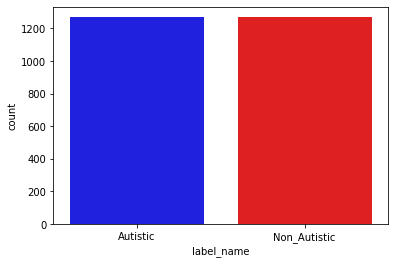

In [20]:
sns.set_palette(sns.color_palette(["b", "r"]))
sns.countplot(x =train_df['label_name'])
plt.show()

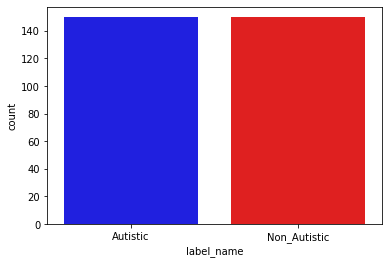

In [21]:
sns.set_palette(sns.color_palette(["b", "r"]))
sns.countplot(x =test_df['label_name'])
plt.show()
     

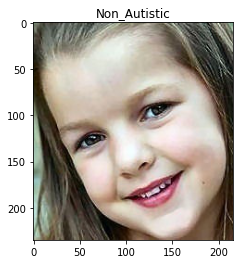

In [22]:
sample = random.choice(file_path)
image = plt.imread(sample)
plt.title(sample.split('/')[-1].split('.')[0])
plt.imshow(image)
plt.show()

In [23]:
train_gen = ImageDataGenerator(
    rotation_range=15,
    rescale=1./255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    width_shift_range=0.1,
    height_shift_range=0.1,
    preprocessing_function = tf.keras.applications.efficientnet.preprocess_input
#     preprocessing_function = efn.preprocess_input
)

# Only rescaling the val set
val_gen = ImageDataGenerator(
    rescale=1/255.0,
    preprocessing_function = tf.keras.applications.efficientnet.preprocess_input
#     preprocessing_function = efn.preprocess_input
)
     

In [24]:
image_size = 224
input_shape = (image_size, image_size, 3)
epochs = 30
batch_size = 20

In [25]:
train_df, validate_df = train_test_split(train_df, test_size=0.1)
train_df = train_df.reset_index()
validate_df = validate_df.reset_index()
total_train = train_df.shape[0]
total_validate = validate_df.shape[0]
total_train,total_validate

(2286, 254)

In [26]:
train_df.head()

,index,file_path,label_name
0,164,/content/AutismDataset/train/Autistic.689.jpg,Autistic
1,2500,/content/AutismDataset/train/Non_Autistic.1125...,Non_Autistic
2,419,/content/AutismDataset/train/Autistic.204.jpg,Autistic
3,857,/content/AutismDataset/train/Autistic.380.jpg,Autistic
4,2318,/content/AutismDataset/train/Autistic.714.jpg,Autistic


In [27]:
validate_df.head()

,index,file_path,label_name
0,1330,/content/AutismDataset/train/Autistic.417.jpg,Autistic
1,1440,/content/AutismDataset/train/Autistic.826.jpg,Autistic
2,236,/content/AutismDataset/train/Non_Autistic.23.jpg,Non_Autistic
3,178,/content/AutismDataset/train/Non_Autistic.447.jpg,Non_Autistic
4,787,/content/AutismDataset/train/Autistic.97.jpg,Autistic


In [28]:
train_set = train_gen.flow_from_dataframe(
    train_df, 
    x_col='file_path',
    y_col='label_name',
    target_size=(image_size,image_size), 
    class_mode='categorical', 
    shuffle=True, 
    batch_size=batch_size)
val_set = val_gen.flow_from_dataframe(
    validate_df, 
    x_col='file_path',
    y_col='label_name',
    target_size=(image_size,image_size), 
    class_mode='categorical', 
    shuffle=True, 
    batch_size=batch_size)

Found 2286 validated image filenames belonging to 2 classes.
Found 254 validated image filenames belonging to 2 classes.


In [29]:
class_dict = {v:k for k,v in train_set.class_indices.items()}
class_dict

{0: 'Autistic', 1: 'Non_Autistic'}

In [30]:
train_set.image_shape,val_set.image_shape

((224, 224, 3), (224, 224, 3))

In [31]:
def see_examples(datagen, figsize=(16,16),nrows=4, ncols=4):
    fig, ax = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols)
    batch_idx = np.random.randint(low=0, high=len(datagen), size=(nrows,ncols))
    for i in range(nrows):
        for j in range(ncols):
            imgs, labels = datagen[batch_idx[i,j]]
            sample_idx = np.random.randint(low=0, high=len(imgs))
            img = imgs[sample_idx]
            label = labels[sample_idx]
            label = class_dict[np.argmax(label)]
            ax[i,j].axis('off')
            ax[i,j].imshow(img)
            ax[i,j].set_title(label)
    plt.show()

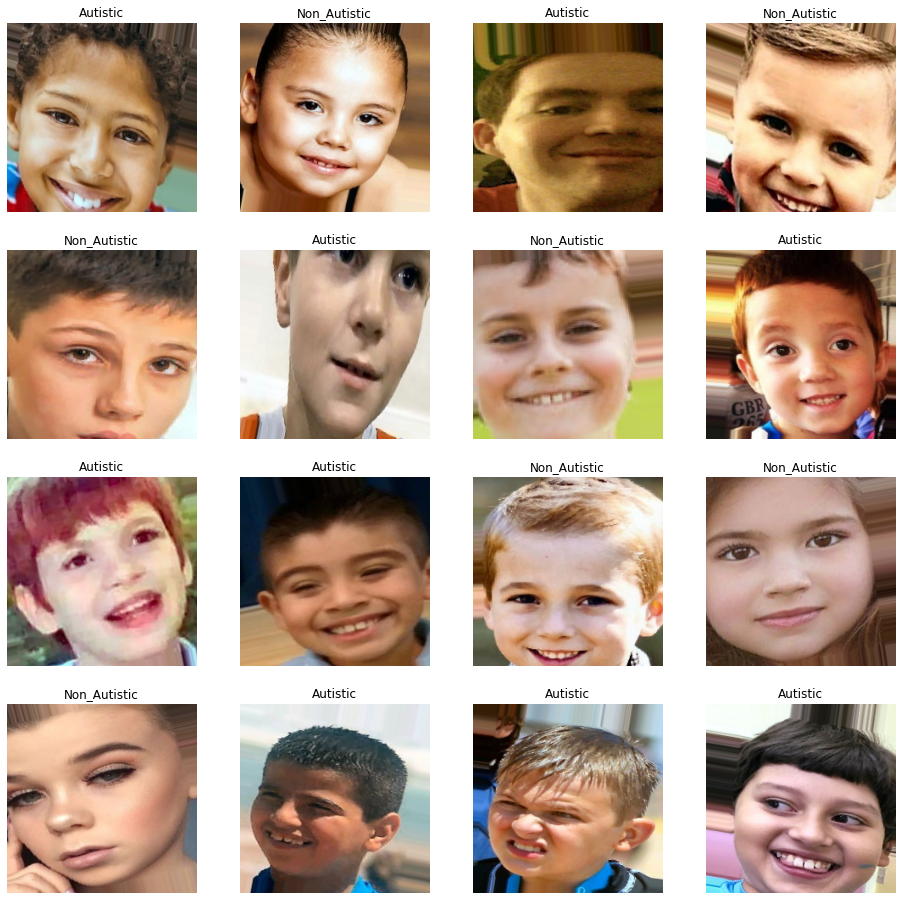

In [32]:
see_examples(train_set)

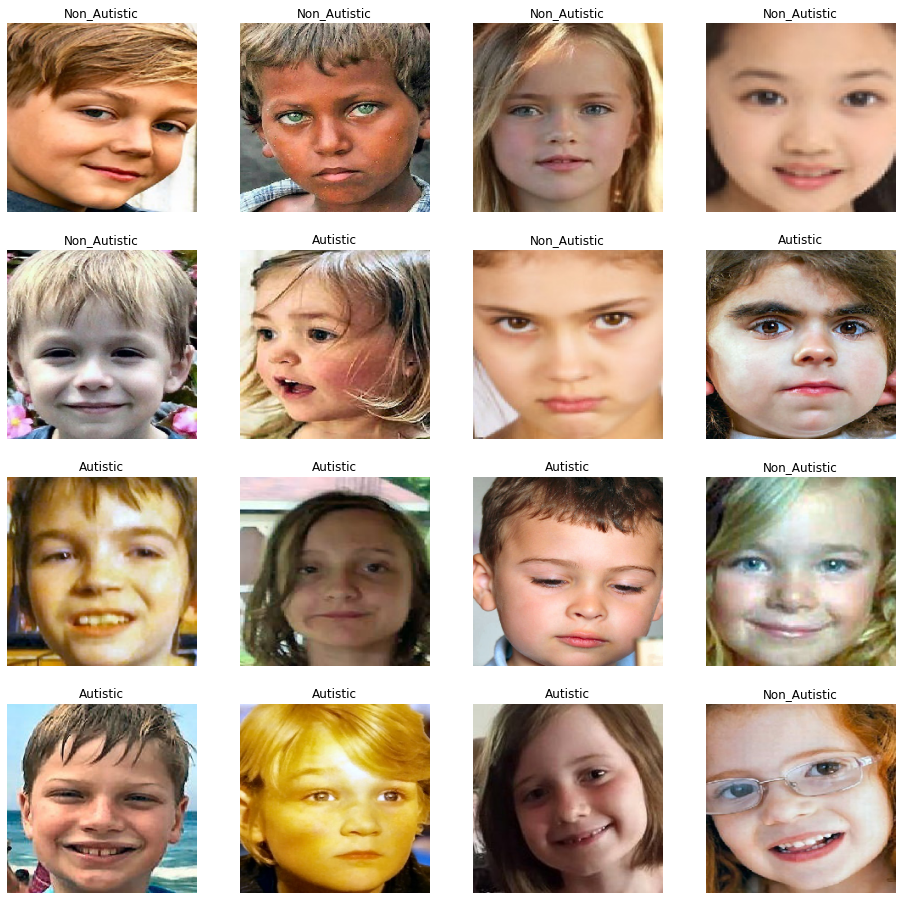

In [33]:
see_examples(val_set)

In [34]:
conv_base = efn.EfficientNetB0(input_shape=input_shape, include_top=False, weights="imagenet")
conv_base.trainable=True

16804768/16804768 [==============================] - 0s 0us/step


In [35]:
input_shape

(224, 224, 3)

In [36]:
conv_base.summary()

Model: "efficientnet-b0"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 stem_conv (Conv2D)             (None, 112, 112, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 stem_bn (BatchNormalization)   (None, 112, 112, 32  128         ['stem_conv[0][0]']              
                                )                                                   

In [37]:
model = Sequential([
    conv_base,
    GlobalMaxPooling2D(),
    
    Dense(units=512,activation='relu'),
    Dense(units=128, activation='relu'),
    Dense(units=64, activation=tf.keras.layers.LeakyReLU(alpha=0.2)),
    Dropout(0.2),
    Dense(units=32, activation='relu'),
    Dense(units=2, activation='softmax')
])

In [38]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnet-b0 (Functional  (None, 7, 7, 1280)       4049564   
 )                                                               
                                                                 
 global_max_pooling2d (Globa  (None, 1280)             0         
 lMaxPooling2D)                                                  
                                                                 
 dense (Dense)               (None, 512)               655872    
                                                                 
 dense_1 (Dense)             (None, 128)               65664     
                                                                 
 dense_2 (Dense)             (None, 64)                8256      
                                                                 
 dropout (Dropout)           (None, 64)                0

In [39]:
callbacks = [
    EarlyStopping(min_delta=1e-5, patience=10),
    ModelCheckpoint('best_model.h5', save_best_only=True)
]

metrics = [
    CategoricalAccuracy(), 
#     F1Score(num_classes=2), 
#     Precision(), 
#     Recall(), 
#     AUC()
]

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=metrics)

In [3]:
  cd src

/content/face-emotion-recognition/src


In [2]:
cd face-emotion-recognition/

/content/face-emotion-recognition


In [40]:
%env CUDA_VISIBLE_DEVICES=0

env: CUDA_VISIBLE_DEVICES=0


In [41]:
import os
import numpy as np
import matplotlib.pyplot as plt
import cv2
from PIL import Image
import tensorflow as tf
from tensorflow.keras.models import Model,Sequential, load_model,model_from_json

%matplotlib inline

In [42]:
from tensorflow.compat.v1.keras.backend import set_session 
config = tf.compat.v1.ConfigProto()
config.gpu_options.allow_growth = True
sess=tf.compat.v1.Session(config=config)
set_session(sess)

In [43]:
from facial_analysis import FacialImageProcessing
imgProcessing=FacialImageProcessing(False)

In [44]:
model=load_model('../models/affectnet_emotions/mobilenet_7.h5')
model.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv1_pad (ZeroPadding2D)   (None, 225, 225, 3)       0         
                                                                 
 conv1 (Conv2D)              (None, 112, 112, 32)      864       
                                                                 
 conv1_bn (BatchNormalizatio  (None, 112, 112, 32)     128       
 n)                                                              
                                                                 
 conv1_relu (ReLU)           (None, 112, 112, 32)      0         
                                                                 
 conv_dw_1 (DepthwiseConv2D)  (None, 112, 112, 32)     288       
                                                           

In [45]:
def mobilenet_preprocess_input(x,**kwargs):
    x[..., 0] -= 103.939
    x[..., 1] -= 116.779
    x[..., 2] -= 123.68
    return x
preprocessing_function=mobilenet_preprocess_input
INPUT_SIZE = (224, 224)

In [46]:
idx_to_class={0: 'Anger', 1: 'Disgust', 2: 'Fear', 3: 'Happiness', 4: 'Neutral', 5: 'Sadness', 6: 'Surprise'}

<ipython-input-47-bc5dec68f006>:11: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  box = bbox.astype(np.int)


1/1 [==============================] - 0s 20ms/step


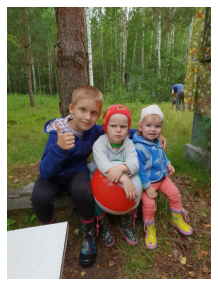

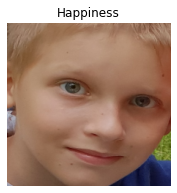

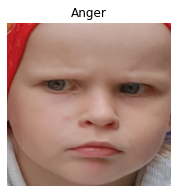

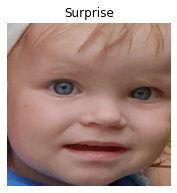

In [47]:
import matplotlib.pyplot as plt
fpath='../test_images/20180720_174416.jpg'
frame_bgr=cv2.imread(fpath)
plt.figure(figsize=(5, 5))
plt.axis('off')
frame = cv2.cvtColor(frame_bgr, cv2.COLOR_BGR2RGB)
plt.imshow(frame)
bounding_boxes, points = imgProcessing.detect_faces(frame)
points = points.T
for bbox,p in zip(bounding_boxes, points):
    box = bbox.astype(np.int)
    x1,y1,x2,y2=box[0:4]    
    face_img=frame[y1:y2,x1:x2,:]
    
    face_img=cv2.resize(face_img,INPUT_SIZE)
    inp=face_img.astype(np.float32)
    inp[..., 0] -= 103.939
    inp[..., 1] -= 116.779
    inp[..., 2] -= 123.68
    inp = np.expand_dims(inp, axis=0)
    scores=model.predict(inp)[0]
    plt.figure(figsize=(3, 3))
    plt.axis('off')
    plt.imshow(face_img)
    plt.title(idx_to_class[np.argmax(scores)])

1/1 [==============================] - 0s 31ms/step


<ipython-input-48-16f7b56364f8>:76: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  box = bbox.astype(np.int)


1/1 [==============================] - 0s 33ms/step


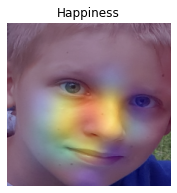

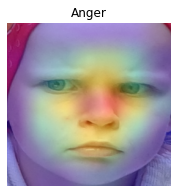

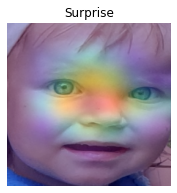

In [48]:
# Code borrowed from https://keras.io/examples/vision/grad_cam/
import matplotlib.cm as cm
def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()
def save_and_display_gradcam(face_img, alpha=0.4):
    last_conv_layer_name = "conv_pw_13"
    inp=face_img.astype(np.float32)
    inp=preprocessing_function(inp)
    inp = np.expand_dims(inp, axis=0)
    # Remove last layer's softmax
    model.layers[-1].activation = None

    # Print what the top predicted class is
    scores = model.predict(inp)[0]

    # Generate class activation heatmap
    heatmap = make_gradcam_heatmap(inp, model, last_conv_layer_name)

    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = tf.keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((face_img.shape[1], face_img.shape[0]))
    jet_heatmap = tf.keras.preprocessing.image.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + face_img
    superimposed_img = tf.keras.preprocessing.image.array_to_img(superimposed_img)
    #superimposed_img.save(cam_path)
    plt.figure(figsize=(3, 3))
    plt.axis('off')
    plt.title(idx_to_class[np.argmax(scores)])
    plt.imshow(superimposed_img)


for bbox,p in zip(bounding_boxes, points):
    box = bbox.astype(np.int)
    x1,y1,x2,y2=box[0:4]    
    face_img=frame[y1:y2,x1:x2,:]
    
    face_img=cv2.resize(face_img,INPUT_SIZE)
    save_and_display_gradcam(face_img)

In [49]:
import torch
from PIL import Image
from torchvision import transforms
use_cuda = torch.cuda.is_available()
print(use_cuda)
device = 'cuda' if use_cuda else 'cpu'

True


In [50]:
USE_ENET2=False
NUM_EMOTIONS=8 #7 #
if NUM_EMOTIONS==7:
    idx_to_class={0: 'Anger', 1: 'Disgust', 2: 'Fear', 3: 'Happiness', 4: 'Neutral', 5: 'Sadness', 6: 'Surprise'}
else:
    idx_to_class={0: 'Anger', 1: 'Contempt', 2: 'Disgust', 3: 'Fear', 4: 'Happiness', 5: 'Neutral', 6: 'Sadness', 7: 'Surprise'}
if USE_ENET2:
    IMG_SIZE=260
    if NUM_EMOTIONS==7: # 7 emotions
        PATH='../models/affectnet_emotions/enet_b2_7.pt'
    else:
        PATH='../models/affectnet_emotions/enet_b2_8.pt'
else:
    IMG_SIZE=224
    if NUM_EMOTIONS==7: # 7 emotions from AFFECT_IMG_SEVEN_TRAIN_DATA_DIR and AFFECT_IMG_SEVEN_VAL_DATA_DIR
        PATH='../models/affectnet_emotions/enet_b0_7.pt'
    else:
        #PATH='../models/affectnet_emotions/enet_b0_8_best_vgaf.pt'
        PATH='../models/affectnet_emotions/enet_b0_8_best_afew.pt'

In [51]:
test_transforms = transforms.Compose(
    [
        transforms.Resize((IMG_SIZE,IMG_SIZE)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                     std=[0.229, 0.224, 0.225])
    ]
)
print(PATH)
model = torch.load(PATH,map_location=torch.device('cpu'))
model=model.to(device)
model.eval()

../models/affectnet_emotions/enet_b0_8_best_afew.pt


EfficientNet(
  (conv_stem): Conv2dSame(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
  (bn1): BatchNormAct2d(
    32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True
    (drop): Identity()
    (act): SiLU(inplace=True)
  )
  (blocks): Sequential(
    (0): Sequential(
      (0): DepthwiseSeparableConv(
        (conv_dw): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
        (bn1): BatchNormAct2d(
          32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True
          (drop): Identity()
          (act): SiLU(inplace=True)
        )
        (se): SqueezeExcite(
          (conv_reduce): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1))
          (act1): SiLU(inplace=True)
          (conv_expand): Conv2d(8, 32, kernel_size=(1, 1), stride=(1, 1))
          (gate): Sigmoid()
        )
        (conv_pw): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn2): BatchNormAct2d(
          16, eps=

In [16]:
!pip install timm

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 549.1/549.1 KB 32.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.3/190.3 KB 21.8 MB/s eta 0:00:00


<ipython-input-52-cbe7141cc1d8>:9: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  box = bbox.astype(np.int)


happy [('Anger', -25.85286), ('Contempt', -17.398289), ('Disgust', -14.658852), ('Fear', -22.239817), ('Happiness', -2.6434808), ('Neutral', -26.899076), ('Sadness', -21.794415), ('Surprise', -16.488811)]
happy [('Anger', -15.312767), ('Contempt', -5.73201), ('Disgust', -11.096941), ('Fear', -12.610823), ('Happiness', 2.2038743), ('Neutral', -8.655743), ('Sadness', -4.388487), ('Surprise', -10.20379)]
happy [('Anger', -5.803671), ('Contempt', -4.7319455), ('Disgust', -3.3491724), ('Fear', -7.018279), ('Happiness', 3.342616), ('Neutral', -6.840306), ('Sadness', -5.265852), ('Surprise', -4.883078)]
happy [('Anger', -14.37934), ('Contempt', -5.4167666), ('Disgust', -8.303343), ('Fear', -8.288087), ('Happiness', 1.4769427), ('Neutral', -6.8337593), ('Sadness', -9.541487), ('Surprise', -3.003317)]
happy [('Anger', -30.526106), ('Contempt', -14.075378), ('Disgust', -22.80097), ('Fear', -32.500454), ('Happiness', 0.40378314), ('Neutral', -24.188099), ('Sadness', -18.148132), ('Surprise', -26.

<ipython-input-52-cbe7141cc1d8>:17: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(3, 3))


fear [('Anger', -14.37934), ('Contempt', -5.4167666), ('Disgust', -8.303343), ('Fear', -8.288087), ('Happiness', 1.4769427), ('Neutral', -6.8337593), ('Sadness', -9.541487), ('Surprise', -3.003317)]
fear [('Anger', -30.526106), ('Contempt', -14.075378), ('Disgust', -22.80097), ('Fear', -32.500454), ('Happiness', 0.40378314), ('Neutral', -24.188099), ('Sadness', -18.148132), ('Surprise', -26.851433)]
fear [('Anger', 1.1410761), ('Contempt', -0.1235493), ('Disgust', -1.4395026), ('Fear', -1.8576227), ('Happiness', -0.59177965), ('Neutral', 3.4211907), ('Sadness', 4.0341253), ('Surprise', -0.8052548)]
fear [('Anger', -1.8388371), ('Contempt', 3.524197), ('Disgust', -1.2180059), ('Fear', -3.3410418), ('Happiness', 3.4602556), ('Neutral', 1.7143234), ('Sadness', -0.87529266), ('Surprise', -2.9835322)]
fear [('Anger', -11.359175), ('Contempt', -2.1357977), ('Disgust', -7.6922417), ('Fear', -13.87874), ('Happiness', 5.2102966), ('Neutral', -5.0975795), ('Sadness', -7.282332), ('Surprise', -9.

<ipython-input-52-cbe7141cc1d8>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(5, 5))


contempt [('Anger', -25.85286), ('Contempt', -17.398289), ('Disgust', -14.658852), ('Fear', -22.239817), ('Happiness', -2.6434808), ('Neutral', -26.899076), ('Sadness', -21.794415), ('Surprise', -16.488811)]
contempt [('Anger', -15.312767), ('Contempt', -5.73201), ('Disgust', -11.096941), ('Fear', -12.610823), ('Happiness', 2.2038743), ('Neutral', -8.655743), ('Sadness', -4.388487), ('Surprise', -10.20379)]
contempt [('Anger', -5.803671), ('Contempt', -4.7319455), ('Disgust', -3.3491724), ('Fear', -7.018279), ('Happiness', 3.342616), ('Neutral', -6.840306), ('Sadness', -5.265852), ('Surprise', -4.883078)]
contempt [('Anger', -14.37934), ('Contempt', -5.4167666), ('Disgust', -8.303343), ('Fear', -8.288087), ('Happiness', 1.4769427), ('Neutral', -6.8337593), ('Sadness', -9.541487), ('Surprise', -3.003317)]
contempt [('Anger', -30.526106), ('Contempt', -14.075378), ('Disgust', -22.80097), ('Fear', -32.500454), ('Happiness', 0.40378314), ('Neutral', -24.188099), ('Sadness', -18.148132), ('

<Figure size 360x360 with 0 Axes>

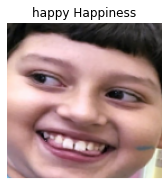

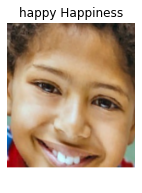

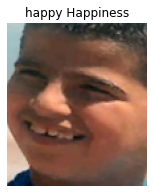

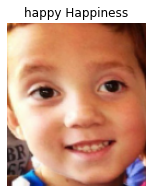

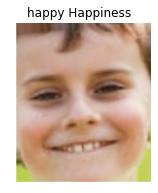

...

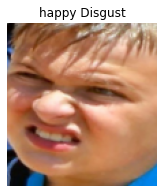

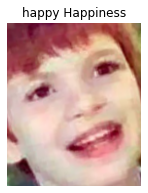

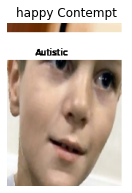

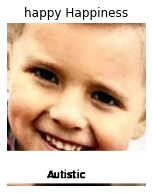

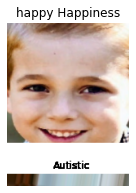

<Figure size 360x360 with 0 Axes>

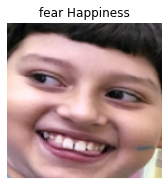

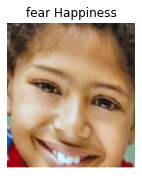

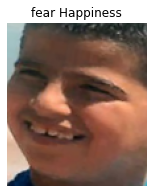

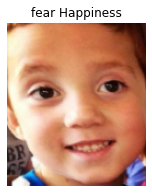

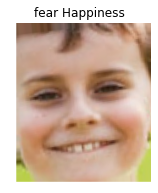

...

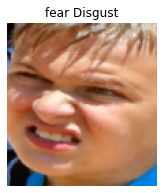

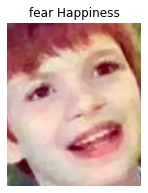

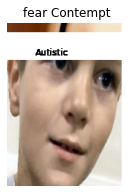

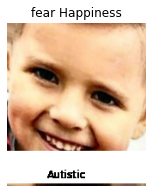

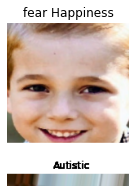

<Figure size 360x360 with 0 Axes>

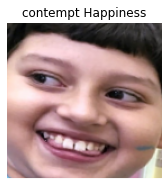

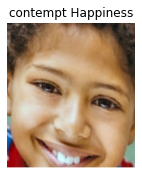

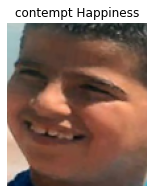

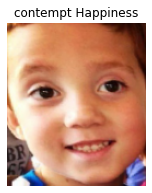

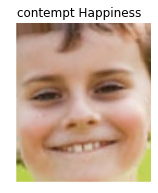

...

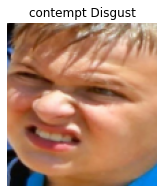

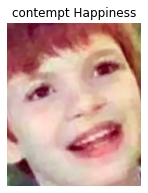

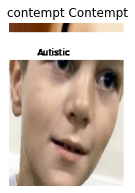

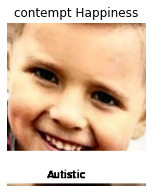

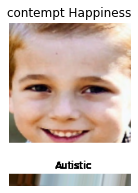

<Figure size 360x360 with 0 Axes>

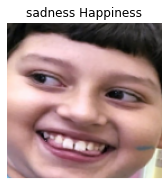

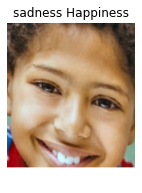

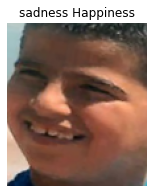

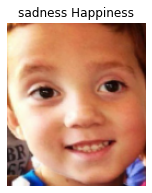

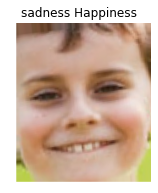

...

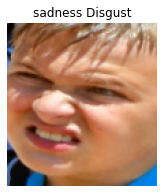

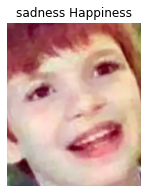

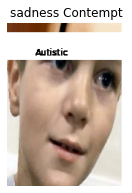

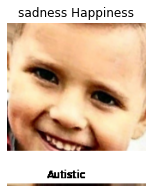

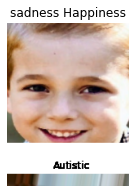

<Figure size 360x360 with 0 Axes>

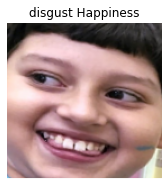

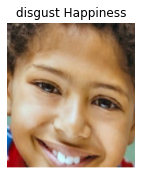

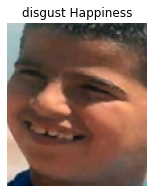

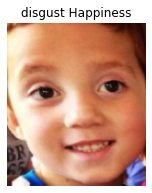

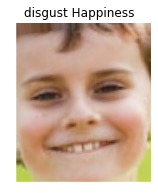

...

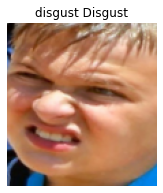

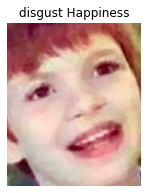

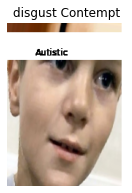

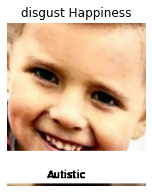

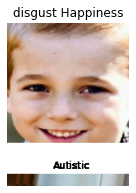

<Figure size 360x360 with 0 Axes>

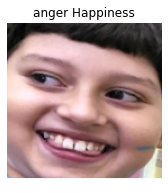

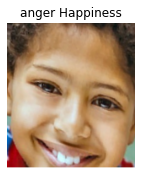

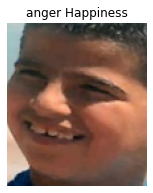

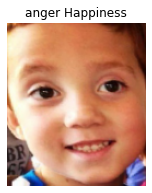

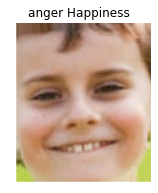

...

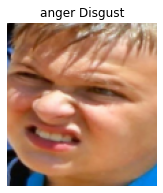

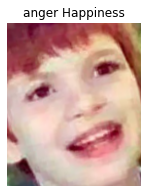

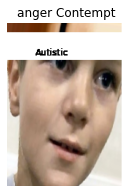

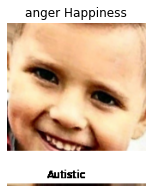

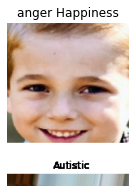

<Figure size 360x360 with 0 Axes>

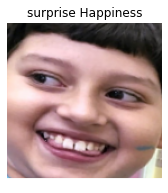

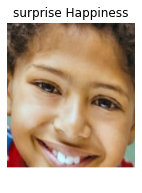

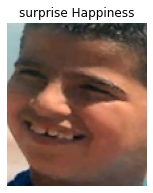

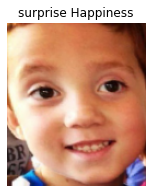

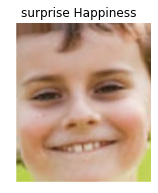

...

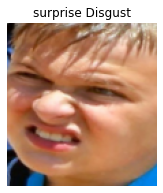

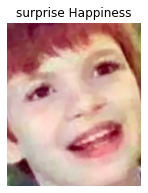

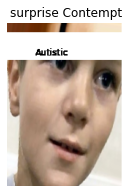

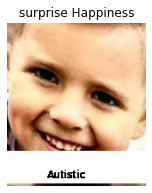

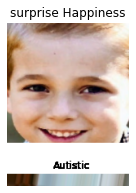

In [52]:
for fn in ['happy','fear','contempt','sadness','disgust','anger','surprise']:
    fpath='/content/face-emotion-recognition/test/1.png'
    frame_bgr=cv2.imread(fpath)
    plt.figure(figsize=(5, 5))
    frame = cv2.cvtColor(frame_bgr, cv2.COLOR_BGR2RGB)
    bounding_boxes, points = imgProcessing.detect_faces(frame)
    points = points.T
    for bbox,p in zip(bounding_boxes, points):
        box = bbox.astype(np.int)
        x1,y1,x2,y2=box[0:4]    
        face_img=frame[y1:y2,x1:x2,:]

        img_tensor = test_transforms(Image.fromarray(face_img))
        img_tensor.unsqueeze_(0)
        scores = model(img_tensor.to(device))
        scores=scores[0].data.cpu().numpy()
        plt.figure(figsize=(3, 3))
        plt.axis('off')
        plt.imshow(face_img)
        plt.title(fn+' '+idx_to_class[np.argmax(scores)])
        print(fn,[(idx_to_class[i],scores[i]) for i in range(len(scores))])

<ipython-input-54-d7cb2d7239cd>:10: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  box = bbox.astype(np.int)


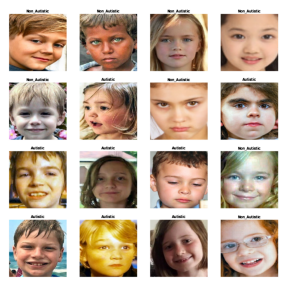

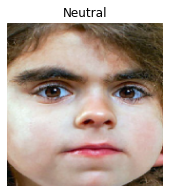

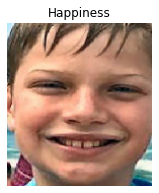

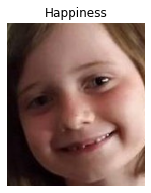

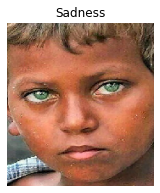

...

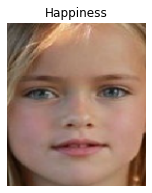

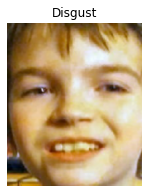

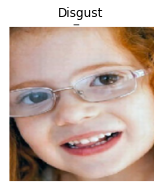

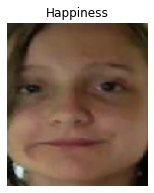

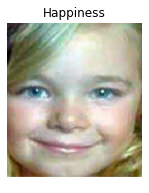

In [54]:
fpath='/content/face-emotion-recognition/test/2.2.jpg'
frame_bgr=cv2.imread(fpath)
plt.figure(figsize=(5, 5))
frame = cv2.cvtColor(frame_bgr, cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(frame)
bounding_boxes, points = imgProcessing.detect_faces(frame)
points = points.T
for bbox,p in zip(bounding_boxes, points):
    box = bbox.astype(np.int)
    x1,y1,x2,y2=box[0:4]    
    face_img=frame[y1:y2,x1:x2,:]
    
    img_tensor = test_transforms(Image.fromarray(face_img))
    img_tensor.unsqueeze_(0)
    scores = model(img_tensor.to(device))
    scores=scores[0].data.cpu().numpy()
    plt.figure(figsize=(3, 3))
    plt.axis('off')
    plt.imshow(face_img)
    plt.title(idx_to_class[np.argmax(scores)])

<ipython-input-55-264e21a9a0ef>:8: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  box = bbox.astype(np.int)


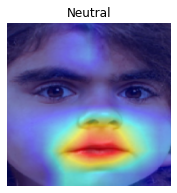

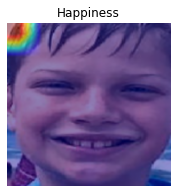

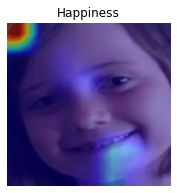

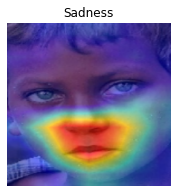

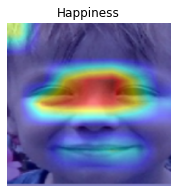

...

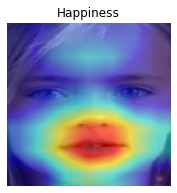

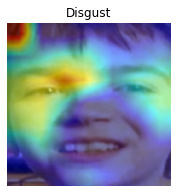

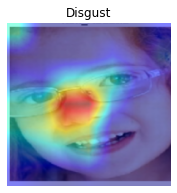

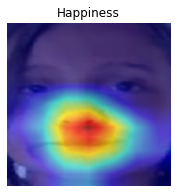

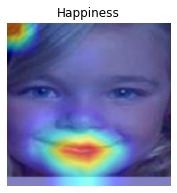

In [55]:
from pytorch_grad_cam import GradCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
target_layers = [model.blocks[-1][-1]]
# Construct the CAM object once, and then re-use it on many images:
cam = GradCAM(model=model, target_layers=target_layers, use_cuda=use_cuda)

for bbox,p in zip(bounding_boxes, points):
    box = bbox.astype(np.int)
    x1,y1,x2,y2=box[0:4]    
    face_img=frame[y1:y2,x1:x2,:]
    
    img_tensor = test_transforms(Image.fromarray(face_img))
    img_tensor.unsqueeze_(0)
    scores = model(img_tensor.to(device))
    scores=scores[0].data.cpu().numpy()
    grayscale_cam = cam(input_tensor=img_tensor)
    grayscale_cam = grayscale_cam[0, :]
    face_img=cv2.resize(face_img,(IMG_SIZE,IMG_SIZE))
    rgb_img = np.float32(face_img) / 255
    visualization = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)
    plt.figure(figsize=(3, 3))
    plt.axis('off')
    plt.imshow(visualization)
    plt.title(idx_to_class[np.argmax(scores)])

<ipython-input-60-5eba13108ec0>:9: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  box = bbox.astype(np.int)


happy [('Anger', 1.0374703), ('Contempt', 0.05002064), ('Disgust', 2.0596702), ('Fear', -1.5188189), ('Happiness', -0.02602603), ('Neutral', 2.502443), ('Sadness', 0.7112111), ('Surprise', -1.9269036)]
happy [('Anger', -2.8170912), ('Contempt', -2.385916), ('Disgust', -0.27713737), ('Fear', -4.984355), ('Happiness', 2.7416785), ('Neutral', -1.9333744), ('Sadness', -2.0159085), ('Surprise', -5.6559134)]
happy [('Anger', -1.2834469), ('Contempt', -0.4394325), ('Disgust', 2.8065965), ('Fear', -2.7292645), ('Happiness', 3.0115778), ('Neutral', -5.0342174), ('Sadness', -3.5542917), ('Surprise', -3.0557215)]
happy [('Anger', 0.24554636), ('Contempt', 0.6732059), ('Disgust', -0.2532214), ('Fear', -1.6609764), ('Happiness', 0.96437496), ('Neutral', 2.7822216), ('Sadness', 2.6935506), ('Surprise', 0.2500723)]
happy [('Anger', -16.090822), ('Contempt', -13.347967), ('Disgust', -11.33556), ('Fear', -13.356068), ('Happiness', 2.9599104), ('Neutral', -13.018398), ('Sadness', -8.67658), ('Surprise',

ValueError: ignored

<Figure size 360x360 with 0 Axes>

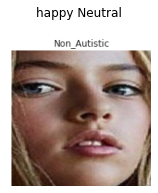

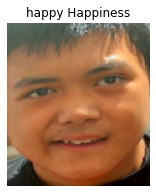

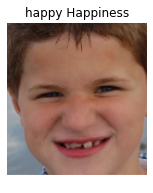

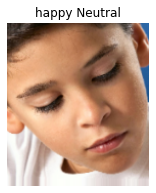

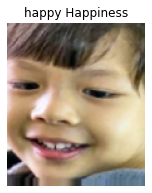

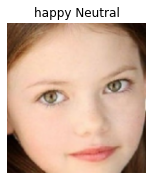

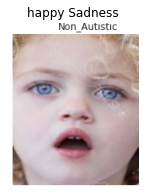

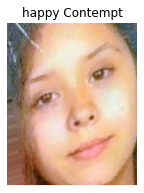

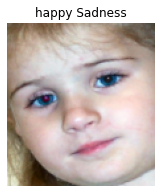

In [60]:
for fn in ['happy','fear','contempt','sadness','disgust','anger','surprise']:
    fpath='/content/face-emotion-recognition/test/3.png'
    frame_bgr=cv2.imread(fpath)
    plt.figure(figsize=(5, 5))
    frame = cv2.cvtColor(frame_bgr, cv2.COLOR_BGR2RGB)
    bounding_boxes, points = imgProcessing.detect_faces(frame)
    points = points.T
    for bbox,p in zip(bounding_boxes, points):
        box = bbox.astype(np.int)
        x1,y1,x2,y2=box[0:4]    
        face_img=frame[y1:y2,x1:x2,:]

        img_tensor = test_transforms(Image.fromarray(face_img))
        img_tensor.unsqueeze_(0)
        scores = model(img_tensor.to(device))
        scores=scores[0].data.cpu().numpy()
        plt.figure(figsize=(3, 3))
        plt.axis('off')
        plt.imshow(face_img)
        plt.title(fn+' '+idx_to_class[np.argmax(scores)])
        print(fn,[(idx_to_class[i],scores[i]) for i in range(len(scores))])

<ipython-input-58-e0f5eaeffa6e>:10: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  box = bbox.astype(np.int)


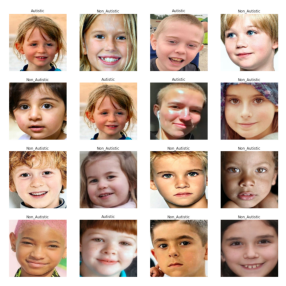

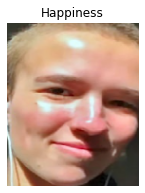

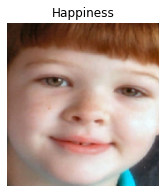

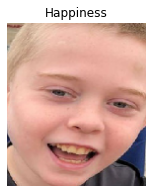

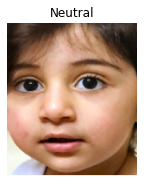

...

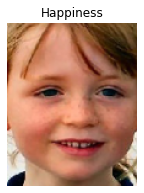

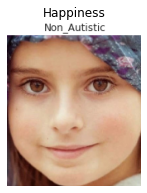

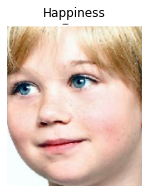

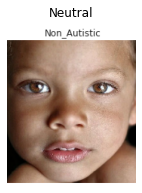

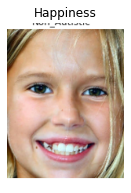

In [58]:
fpath='/content/face-emotion-recognition/test/4.4.jpg'
frame_bgr=cv2.imread(fpath)
plt.figure(figsize=(5, 5))
frame = cv2.cvtColor(frame_bgr, cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(frame)
bounding_boxes, points = imgProcessing.detect_faces(frame)
points = points.T
for bbox,p in zip(bounding_boxes, points):
    box = bbox.astype(np.int)
    x1,y1,x2,y2=box[0:4]    
    face_img=frame[y1:y2,x1:x2,:]
    
    img_tensor = test_transforms(Image.fromarray(face_img))
    img_tensor.unsqueeze_(0)
    scores = model(img_tensor.to(device))
    scores=scores[0].data.cpu().numpy()
    plt.figure(figsize=(3, 3))
    plt.axis('off')
    plt.imshow(face_img)
    plt.title(idx_to_class[np.argmax(scores)])

<ipython-input-59-264e21a9a0ef>:8: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  box = bbox.astype(np.int)


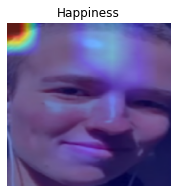

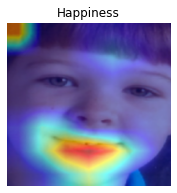

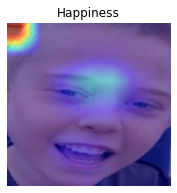

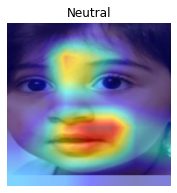

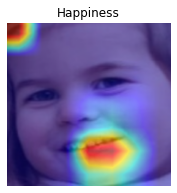

...

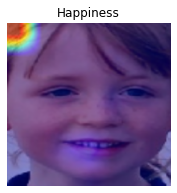

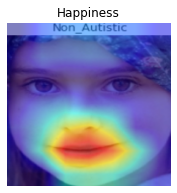

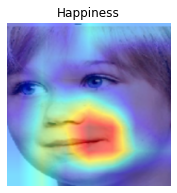

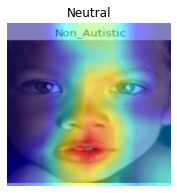

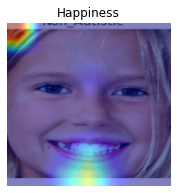

In [59]:
from pytorch_grad_cam import GradCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
target_layers = [model.blocks[-1][-1]]
# Construct the CAM object once, and then re-use it on many images:
cam = GradCAM(model=model, target_layers=target_layers, use_cuda=use_cuda)

for bbox,p in zip(bounding_boxes, points):
    box = bbox.astype(np.int)
    x1,y1,x2,y2=box[0:4]    
    face_img=frame[y1:y2,x1:x2,:]
    
    img_tensor = test_transforms(Image.fromarray(face_img))
    img_tensor.unsqueeze_(0)
    scores = model(img_tensor.to(device))
    scores=scores[0].data.cpu().numpy()
    grayscale_cam = cam(input_tensor=img_tensor)
    grayscale_cam = grayscale_cam[0, :]
    face_img=cv2.resize(face_img,(IMG_SIZE,IMG_SIZE))
    rgb_img = np.float32(face_img) / 255
    visualization = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)
    plt.figure(figsize=(3, 3))
    plt.axis('off')
    plt.imshow(visualization)
    plt.title(idx_to_class[np.argmax(scores)])